# Explore data augmentations

This notebook will be used to test different data augmentation strategies. In your config file, you can modify the augmentations by adding `data_augmentation_options`. For example, I would like to add a random RGB to gray transform with a probability of 0.2:
```
data_augmentation_options {
    random_rgb_to_gray {
    probability: 0.2
    }
```

A complete list of augmentation is provided the [`preprocessor.proto` file of the Tf Object Detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/protos/preprocessor.proto).

### Helper functions

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle

In [2]:
def recenter_image(image):
    # ssd preprocessing
    image += [123.68, 116.779, 103.939]
    return image

def display_instances(image, bboxes, classes):
    image = recenter_image(image)
    w, h, _ = image.shape
    # resize the bboxes
    bboxes[:, [0, 2]] *= w
    bboxes[:, [1, 3]] *= h
    
    f, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image.astype(np.uint8))
    for bb, cl in zip(bboxes, classes):
        y1, x1, y2, x2 = bb
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor='r', linewidth=2)
        ax.add_patch(rec)
    plt.show()

def display_batch(batch):
    # get images, bboxes and classes
    batched_images = batch[0]['image'].numpy()
    batched_bboxes = batch[1]['groundtruth_boxes'].numpy()
    batched_classes = batch[1]['groundtruth_classes'].numpy()
    num_bboxes = batch[1]['num_groundtruth_boxes'].numpy()
    batch_size = batched_images.shape[0]
    for idx in range(batch_size):
        display_instances(batched_images[idx, ...], 
                          batched_bboxes[idx, :num_bboxes[idx], :],
                          batched_classes[idx, ...])

### Display augmentations

In [3]:
from utils import get_train_input

In [4]:
### Display augmentations 
from object_detection.protos import pipeline_pb2
from object_detection.utils import config_util
from edit_config import edit
edit(r"data/train/" ,r"data/val/"  , 2 , "experiments/pretrained_model/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0" , "experiments/label_map.pbtxt")

train_dataset = get_train_input("pipeline_new.config")

INFO:tensorflow:Reading unweighted datasets: ['data/train\\segment-10017090168044687777_6380_000_6400_000_with_camera_labels.tfrecord', 'data/train\\segment-10023947602400723454_1120_000_1140_000_with_camera_labels.tfrecord', 'data/train\\segment-1005081002024129653_5313_150_5333_150_with_camera_labels.tfrecord', 'data/train\\segment-10061305430875486848_1080_000_1100_000_with_camera_labels.tfrecord', 'data/train\\segment-10072140764565668044_4060_000_4080_000_with_camera_labels.tfrecord', 'data/train\\segment-10075870402459732738_1060_000_1080_000_with_camera_labels.tfrecord', 'data/train\\segment-10082223140073588526_6140_000_6160_000_with_camera_labels.tfrecord', 'data/train\\segment-10094743350625019937_3420_000_3440_000_with_camera_labels.tfrecord', 'data/train\\segment-10096619443888687526_2820_000_2840_000_with_camera_labels.tfrecord', 'data/train\\segment-10107710434105775874_760_000_780_000_with_camera_labels.tfrecord', 'data/train\\segment-10153695247769592104_787_000_807_000

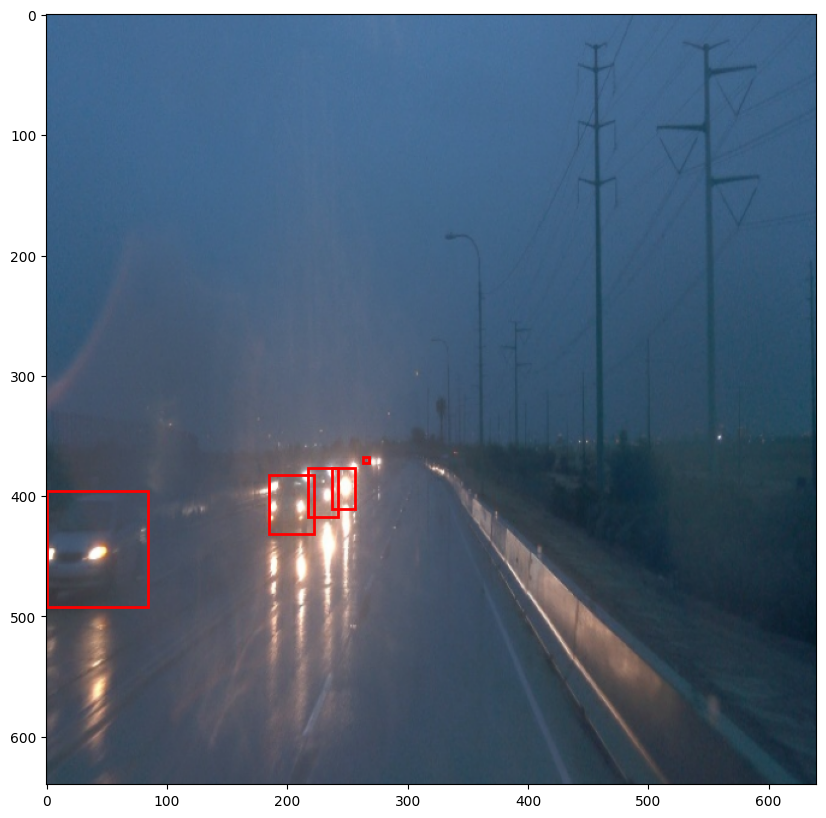

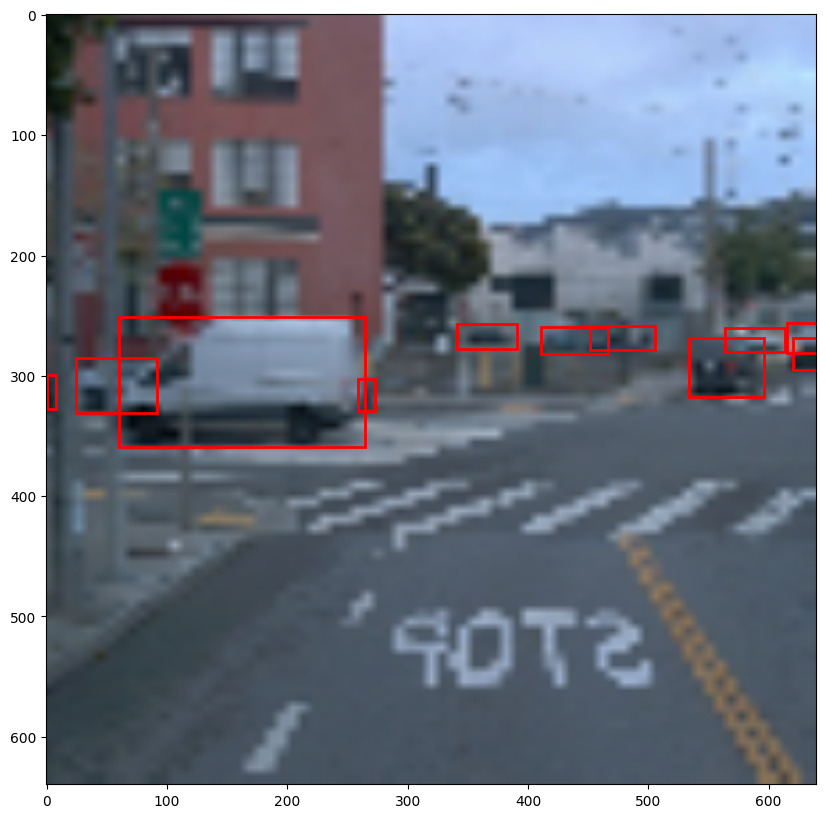

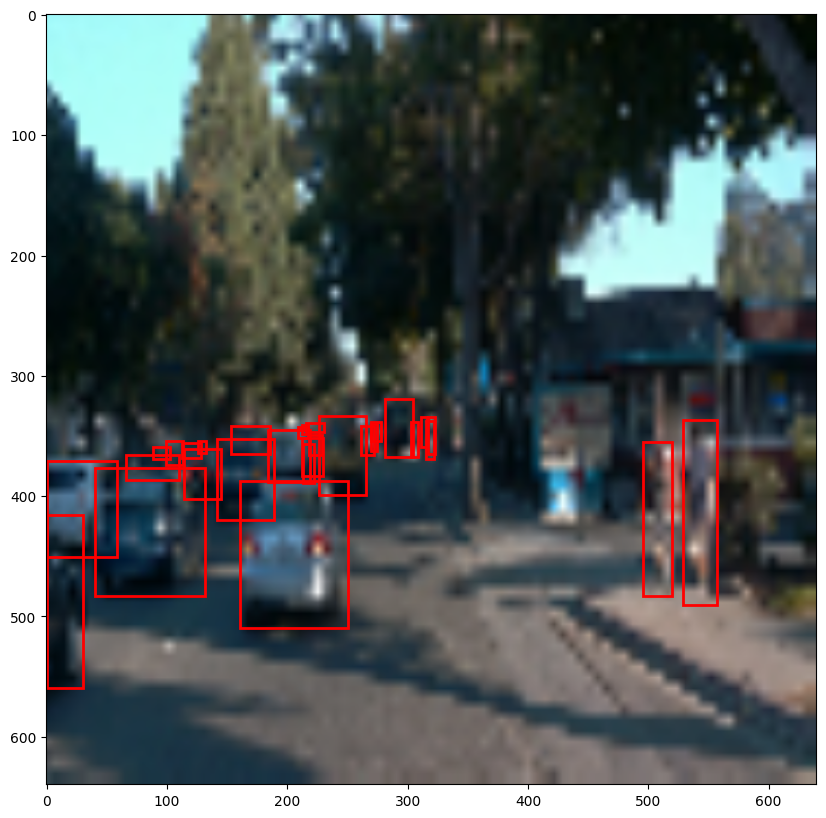

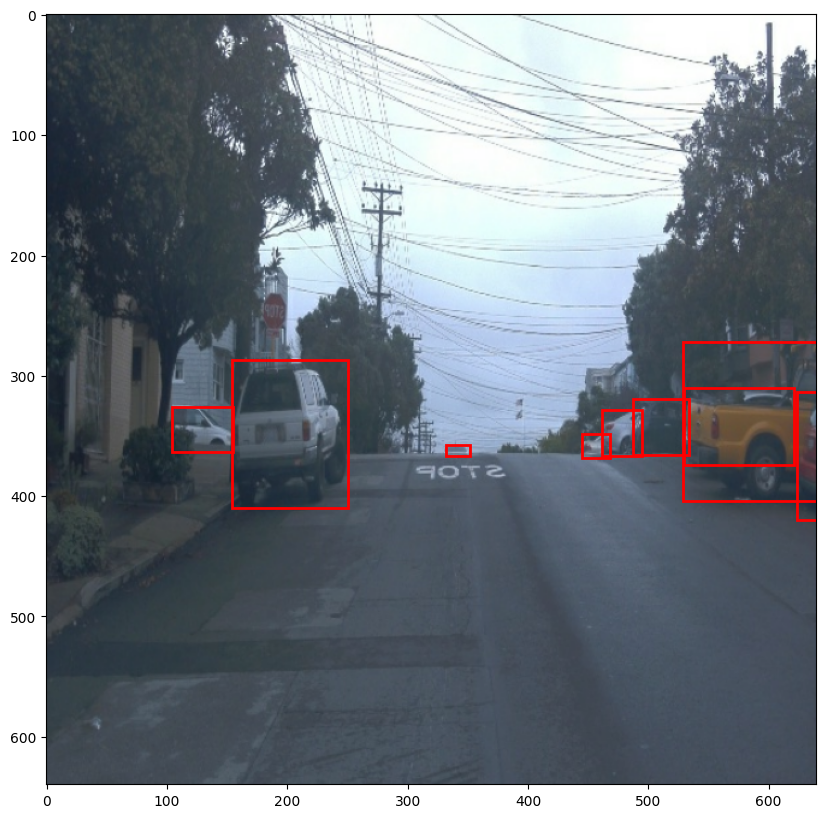

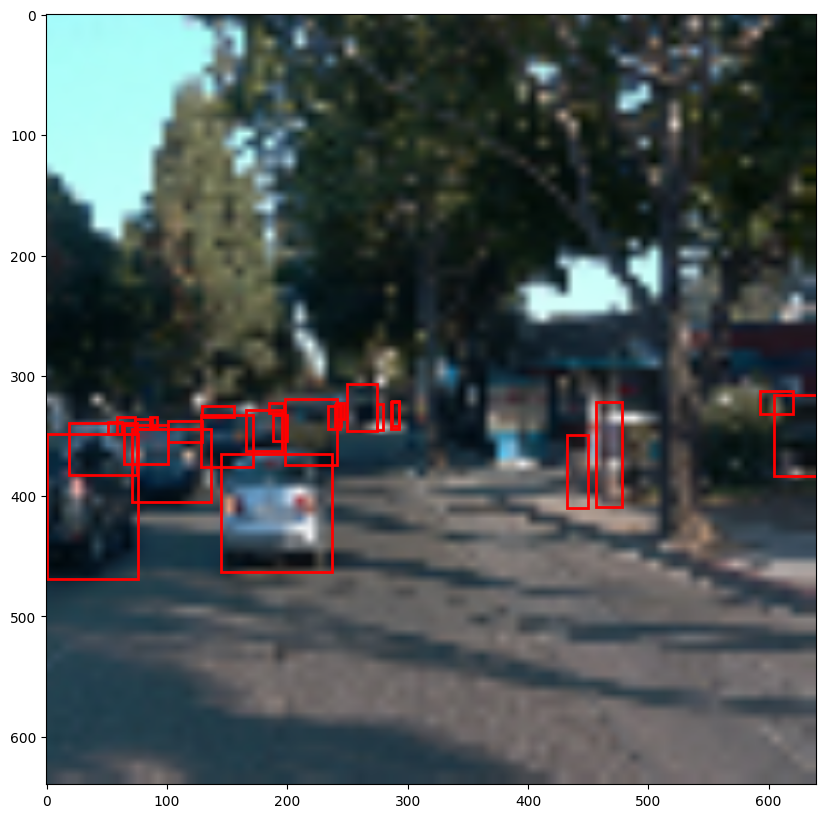

...

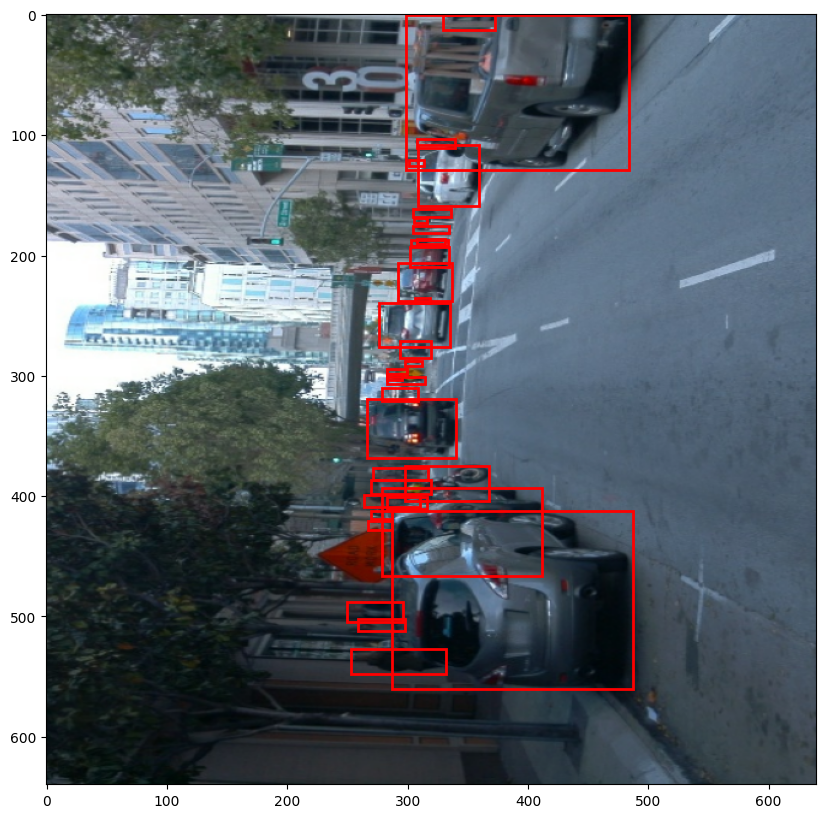

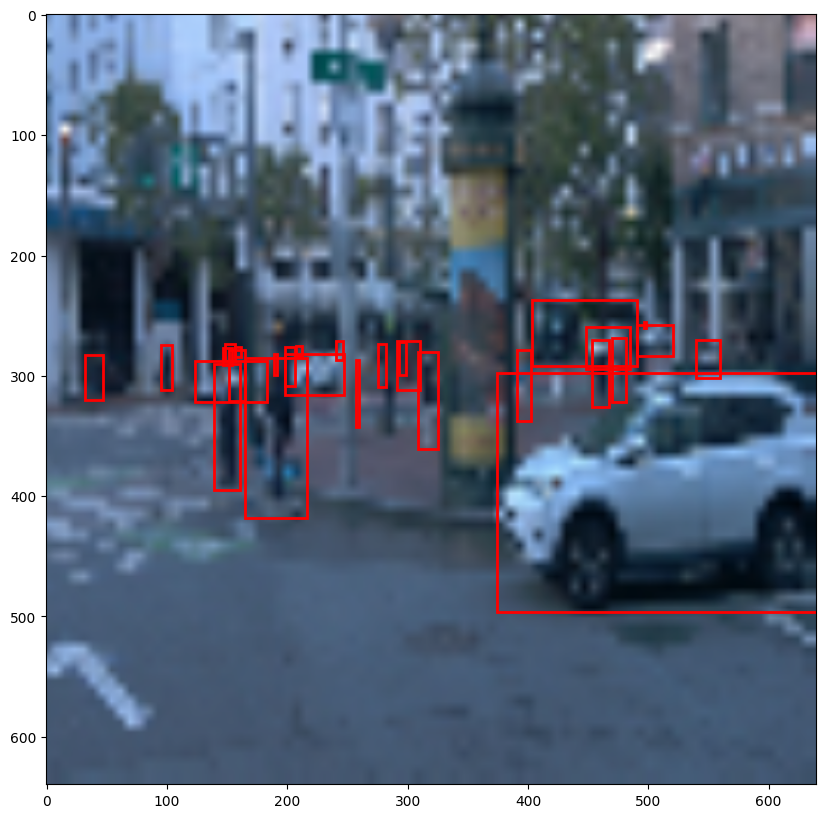

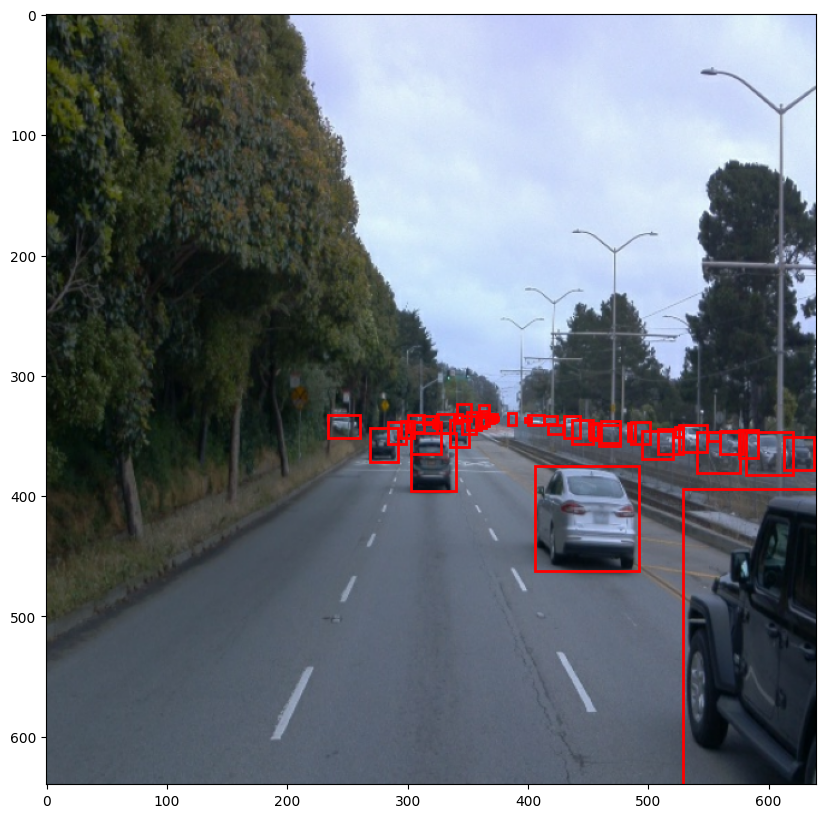

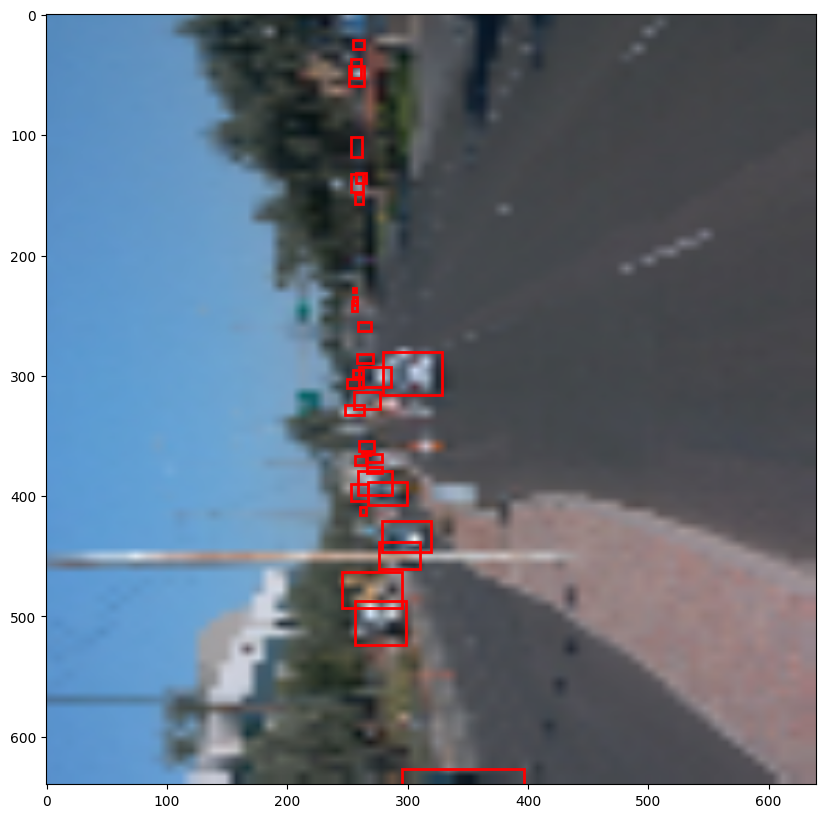

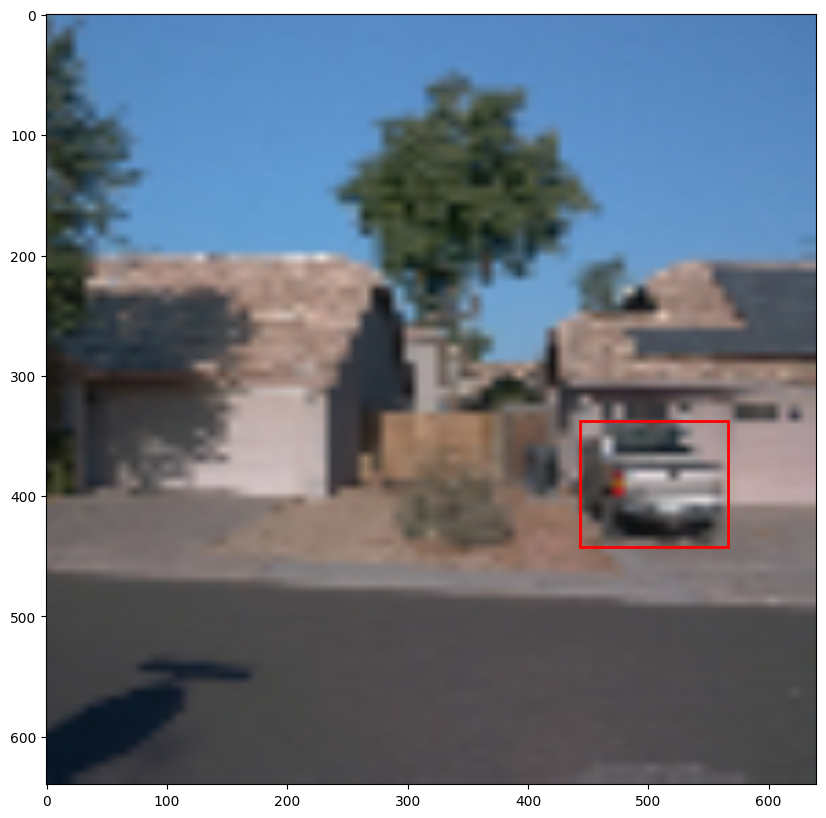

In [5]:
%matplotlib inline

for batch in train_dataset.take(10):
    display_batch(batch)